# Functions Definitions

In [37]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import colors

# find energy of given image
def energy_img(im):

    # convert RGB to grayscale
    gray = 0.299 * im[:,:,0] + 0.587 * im[:,:,1] + 0.114 * im[:,:,2]

    # compute gradients along x and y using numpy
    dx = np.gradient(gray, axis=1)
    dy = np.gradient(gray, axis=0)

    # energy = dx + dy
    energyImg = np.abs(dx) + np.abs(dy)

    return energyImg # return image as an energy map 2D MxN matrix

In [2]:
# find cumulative min energy map using DP
def cumulative_min_energy_map(energyImg, seamDirection):

    M, N = energyImg.shape # image energy map
    cumulativeEnergyMap = energyImg.copy() # copy matrix for use in this function

    if seamDirection == 'VERTICAL':
        # process rows from top to bottom
        for i in range(1, M):
            for j in range(N):
                # boundary handling at image edges
                left = cumulativeEnergyMap[i-1, j-1] if j-1 >= 0 else np.inf
                up   = cumulativeEnergyMap[i-1, j]
                right= cumulativeEnergyMap[i-1, j+1] if j+1 < N else np.inf

                cumulativeEnergyMap[i, j] += min(left, up, right)

    elif seamDirection == 'HORIZONTAL':
        # process columns from left to right
        for j in range(1, N):
            for i in range(M):
                # boundary handling
                up    = cumulativeEnergyMap[i-1, j-1] if i-1 >= 0 else np.inf
                left  = cumulativeEnergyMap[i, j-1]
                down  = cumulativeEnergyMap[i+1, j-1] if i+1 < M else np.inf

                cumulativeEnergyMap[i, j] += min(up, left, down)

    else: # error handlind
        raise ValueError("seamDirection must be 'VERTICAL' or 'HORIZONTAL'")

    return cumulativeEnergyMap # return cheapest/smallest seam with lowest cummulative energy


In [3]:
# find optimal vertical seam
def find_vertical_seam(cumulativeEnergyMap):

    M, N = cumulativeEnergyMap.shape # cum. min energy map
    verticalSeam = np.zeros(M, dtype=np.int32)  # column indices list representing the seam

    # go from bottom to top row, find index of min energy seam
    verticalSeam[M-1] = np.argmin(cumulativeEnergyMap[M-1, :])

    # backtrack upwards
    for i in range(M-2, -1, -1):
        prev_col = verticalSeam[i+1]
        # check neighbors
        col_range = [prev_col]
        if prev_col > 0:
            col_range.append(prev_col - 1)
        if prev_col < N-1:
            col_range.append(prev_col + 1)

        # get best column
        min_col = min(col_range, key=lambda c: cumulativeEnergyMap[i, c])
        verticalSeam[i] = min_col

    return verticalSeam


In [4]:
# find optimal vertical seam
def find_horizontal_seam(cumulativeEnergyMap):

    M, N = cumulativeEnergyMap.shape # cum. min energy map
    horizontalSeam = np.zeros(N, dtype=np.int32) # row indices list representing the seam

    # go from rightmost column to left to find index of min energy seam
    horizontalSeam[N-1] = np.argmin(cumulativeEnergyMap[:, N-1])

    # backtrack leftwards
    for j in range(N-2, -1, -1):
        prev_row = horizontalSeam[j+1]
        # check neighbors
        row_range = [prev_row]
        if prev_row > 0:
            row_range.append(prev_row - 1)
        if prev_row < M-1:
            row_range.append(prev_row + 1)

        # get best row
        min_row = min(row_range, key=lambda r: cumulativeEnergyMap[r, j])
        horizontalSeam[j] = min_row

    return horizontalSeam


In [16]:
# display image with seam
def view_seam(im, seam, seamDirection):

    import matplotlib.pyplot as plt

    im_seam = im.copy() # copy of input image

    # create seam based on position
    if seamDirection == 'VERTICAL':
        for i in range(len(seam)):
            im_seam[i, seam[i]] = [255, 0, 0]  # Red seam

    # same process for horizontal seam
    elif seamDirection == 'HORIZONTAL':
        for j in range(len(seam)):
            im_seam[seam[j], j] = [255, 0, 0]

    else:
        raise ValueError("seamDirection must be 'VERTICAL' or 'HORIZONTAL'")

    plt.imshow(im_seam) # show image with seam drawn
    plt.axis('off')
    plt.show()


In [15]:
# reduce image width by removing vertical seam
def decrease_width(im, energyImg):

    # get cum. energy map for vertical seams
    cumulativeEnergyMap = cumulative_min_energy_map(energyImg, 'VERTICAL')

    # get optimal (lowest) vertical seam
    verticalSeam = find_vertical_seam(cumulativeEnergyMap)

    # remove seam from the image
    M, N, _ = im.shape                              # M = height (rows), N = width (columns), _ = 3 color channels (not needed)
    mask = np.ones((M, N), dtype=bool)              # create a mask (all True) the same size as the image
    for i in range(M):
        mask[i, verticalSeam[i]] = False            # mark the seam pixel in this column as false

    # keep only pixels marked True in the mask, then reshape back into an image
    reducedColorImg = im[mask].reshape((M, N-1, 3))

    # recompute energy map for reduced image
    reducedEnergyImg = energy_img(reducedColorImg)

    return reducedColorImg, reducedEnergyImg # return new reduced image and energy map


In [17]:
# reduce image height by removing horizontal seam.
def decrease_height(im, energyImg):

    # get cum. energy map for horizontal seams
    cumulativeEnergyMap = cumulative_min_energy_map(energyImg, 'HORIZONTAL')

    # get optimal (lowest) seam
    horizontalSeam = find_horizontal_seam(cumulativeEnergyMap)

    # remove the seam row-by-row for each column
    M, N, _ = im.shape                          # M = height (rows), N = width (columns), _ = channels
    reducedColorImg = np.zeros((M-1, N, 3), dtype=im.dtype)  # new image, one row shorter

    for j in range(N):                          # loop through each column
        row = horizontalSeam[j]                 # row index of seam pixel in this column
        # copy all rows above the seam unchanged
        reducedColorImg[:row, j, :] = im[:row, j, :]
        # copy all rows below the seam, shifted up by 1
        reducedColorImg[row:, j, :] = im[row+1:, j, :]

    # recompute energy for reduced image
    reducedEnergyImg = energy_img(reducedColorImg)

    return reducedColorImg, reducedEnergyImg


# Questions Section



### Upload images helper

In [38]:
# helper to load image
def load_rgb(path):
    bgr = cv2.imread(path) # load image in BGR (Blue, Green, Red) order.
    if bgr is None: # error handling
        raise FileNotFoundError(f"Could not load {path}. Put the file in the Colab working directory.")
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB) # convert to rgb
    return rgb

# helper to save RGB image
def save_rgb(path, img_rgb):
    plt.imsave(path, img_rgb.astype(np.uint8))

# quick display helper
def show_images(titles, images, figsize=(12,4), cmap=None):
    n = len(images) # number of images to display
    plt.figure(figsize=figsize) # create figure
    for i, (t, img) in enumerate(zip(titles, images), 1):
        plt.subplot(1, n, i)             # create subplot in row=1, column=n, index=i
        plt.title(t)                     # add title above the image
        plt.axis('off')                  # remove axes
        if img is None:
            continue
        if img.ndim == 2:  # do grayscale / energy
            plt.imshow(img, cmap='gray')
        else: # show rgb image
            plt.imshow(img.astype(np.uint8))
    plt.tight_layout()
    plt.show()

# paths to jpg files
prague_path = "inputSeamCarvingPrague.jpg"
mall_path   = "inputSeamCarvingMall.jpg"

# load images
prague = load_rgb(prague_path)
mall   = load_rgb(mall_path)

# remove k horizontal seams
def remove_k_vertical(im, k):
    im_cur = im.copy()                                  # make copy image
    energy = energy_img(im_cur).astype(np.float64)      # compute the initial energy map of the image
    for i in range(k):                                  # repeat k times
        im_cur, energy = decrease_width(im_cur, energy) # remove seam then update image and energy map
    return im_cur

# remove k horizontal seams
def remove_k_horizontal(im, k):
    im_cur = im.copy()
    energy = energy_img(im_cur).astype(np.float64)
    for i in range(k):
        im_cur, energy = decrease_height(im_cur, energy)
    return im_cur


## Question 1
#### - Reduce width by 100 pixels for 2 given images

Processing prague image...
Saved outputReduceWidthPrague.png
Processing mall image...
Saved outputReduceWidthMall.png


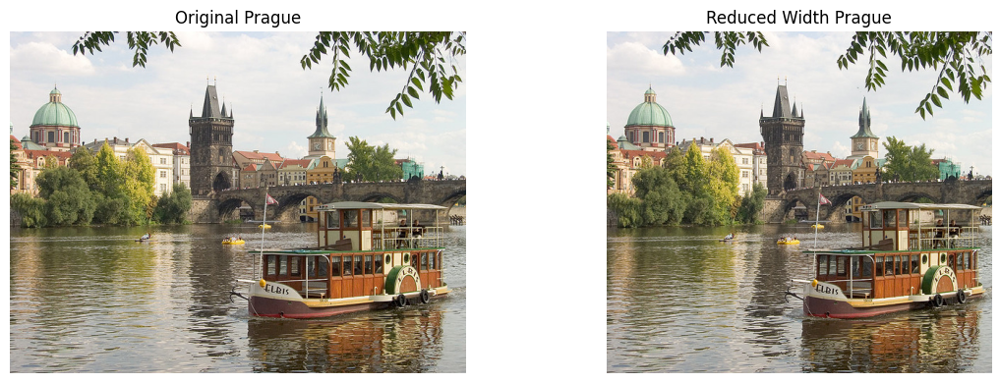

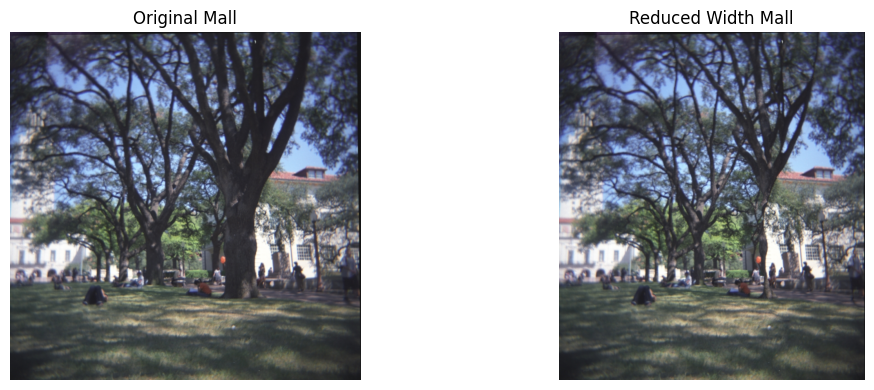

In [35]:
# number of seams to remove
k_width = 100

# show stages of progression
print("Processing prague image...")
prague_reduced = remove_k_vertical(prague, k_width)
save_rgb("outputReduceWidthPrague.png", prague_reduced)
print("Saved outputReduceWidthPrague.png")

# mall image
print("Processing mall image...")
mall_reduced = remove_k_vertical(mall, k_width)
save_rgb("outputReduceWidthMall.png", mall_reduced)
print("Saved outputReduceWidthMall.png")

# print
show_images(
    ["Original Prague", "Reduced Width Prague"],
    [prague, prague_reduced]
)
show_images(
    ["Original Mall", "Reduced Width Mall"],
    [mall, mall_reduced]
)


## Question 2

#### - Reduce height by 50 pixels for same 2 given images

Processing prague image...
Saved outputReduceHeightPrague.png
Processing mall image...
Saved outputReduceHeightMall.png


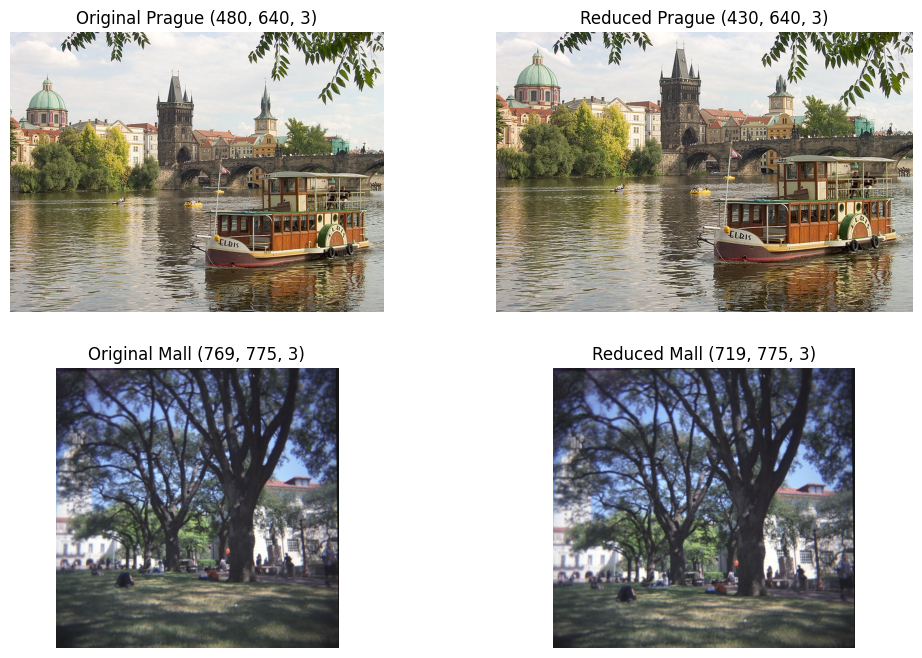

In [28]:
k_height = 50 # seams to remove

# print stages in process
print("Processing prague image...")
prague_h_reduced = remove_k_horizontal(prague, k_height)
save_rgb("outputReduceHeightPrague.png", prague_h_reduced)
print("Saved outputReduceHeightPrague.png")

print("Processing mall image...")
mall_h_reduced = remove_k_horizontal(mall, k_height)
save_rgb("outputReduceHeightMall.png", mall_h_reduced)
print("Saved outputReduceHeightMall.png")

# print comparison of images
plt.figure(figsize=(12,8))

# original prague
plt.subplot(2,2,1)
plt.imshow(prague)  # display image
plt.title(f"Original Prague {prague.shape}") # title and dimensions to show pixels for height and width as well as channels (colors)
plt.axis("off")

# reduced prague
plt.subplot(2,2,2)
plt.imshow(prague_h_reduced)
plt.title(f"Reduced Prague {prague_h_reduced.shape}")
plt.axis("off")

# Original Mall
plt.subplot(2,2,3)
plt.imshow(mall)
plt.title(f"Original Mall {mall.shape}")
plt.axis("off")

# Reduced Mall
plt.subplot(2,2,4)
plt.imshow(mall_h_reduced)
plt.title(f"Reduced Mall {mall_h_reduced.shape}")
plt.axis("off")

plt.show() # display






### Explanation of Output

- In this code block, the removal of seams was still successful even though only 50 pixels were removed from both images, I printed the actual image dimensions and axes but they don't look visually correct.

So I did another example of the horizontal seams being removed where the visual change is more visible where I removed more seams.

Processing Prague image...
Saved outputReduceHeightPrague.png
Processing Mall image...
Saved outputReduceHeightMall.png


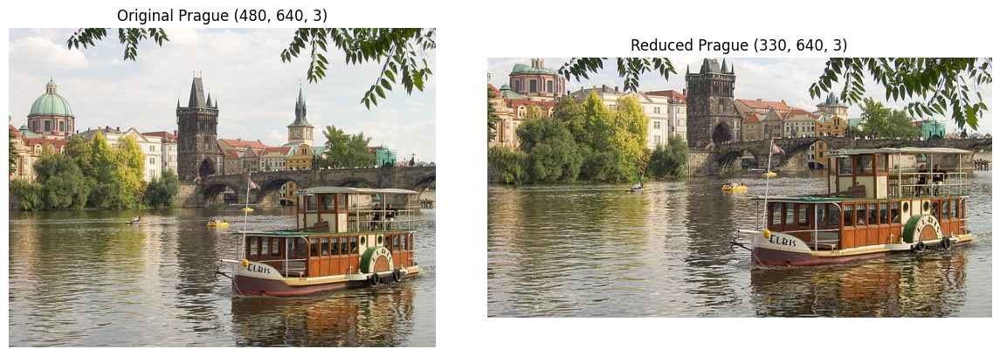

In [22]:
k_height = 150

print("Processing Prague image...")
prague_h_reduced = remove_k_horizontal(prague, k_height)
save_rgb("outputReduceHeightPrague.png", prague_h_reduced)
print("Saved outputReduceHeightPrague.png")

print("Processing Mall image...")
mall_h_reduced = remove_k_horizontal(mall, k_height)
save_rgb("outputReduceHeightMall.png", mall_h_reduced)
print("Saved outputReduceHeightMall.png")

# print results
plt.figure(figsize=(12,8))

# original prague
plt.subplot(2,2,1)
plt.imshow(prague)  # default origin='upper' keeps the image upright
plt.title(f"Original Prague {prague.shape}")
plt.axis("off")

# reduced prague
plt.subplot(2,2,2)
plt.imshow(prague_h_reduced)
plt.title(f"Reduced Prague {prague_h_reduced.shape}")
plt.axis("off")


plt.tight_layout()
plt.show()






## Question 3

#### - show energy and cumulative energy maps for both seams of Prague image

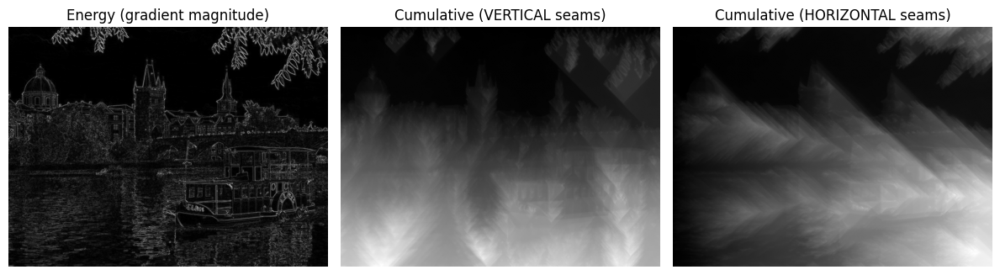

In [ ]:
img = prague.copy()
energy = energy_img(img).astype(np.float64)

# cumulative maps
cum_vert = cumulative_min_energy_map(energy.copy(), 'VERTICAL')
cum_horiz = cumulative_min_energy_map(energy.copy(), 'HORIZONTAL')

# print energy maps
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.title("Energy (gradient magnitude)")
plt.axis('off')
plt.imshow(energy, cmap='gray')

plt.subplot(1,3,2)
plt.title("Cumulative (VERTICAL seams)")
plt.axis('off')
plt.imshow(cum_vert, cmap='gray')

plt.subplot(1,3,3)
plt.title("Cumulative (HORIZONTAL seams)")
plt.axis('off')
plt.imshow(cum_horiz, cmap='gray')

plt.tight_layout()
plt.show()


#### Why these outputs (cumulative energy maps) look the way they do given the original image’s content?

The cummulative energy maps emphasizes strong edges so that object boundaries are bright (high energy) and easy to identify whilst keeping less significant areas, like the sky that has little contrast or edges, dark.

In the image, if you were draw straight lines from the top to the bottom of the image, there is plenty contrast between different objects like the sky, building, bridge, water and boat. This is why the cummulative energy map for the Prague image has a bright appeareance to the bottom of the image as there is plenty different edges and objects in this region of the picture compared to the top of the image which is mostly just the sky which has no contrast.

For the horizontal cumulative map, the seams are calculated from left to right. In doing this, there are strong edges detected mostly to the righ half of the image, which correlates to our previous understanding that when numerous edges are detected, then the map will be lighter. This also explains whythe left side of the image is very dark, as there are less edges here in comparison to the other half.

## Question 4

#### - show and explain first horizontal and vertical seam

Vertical seam on image:


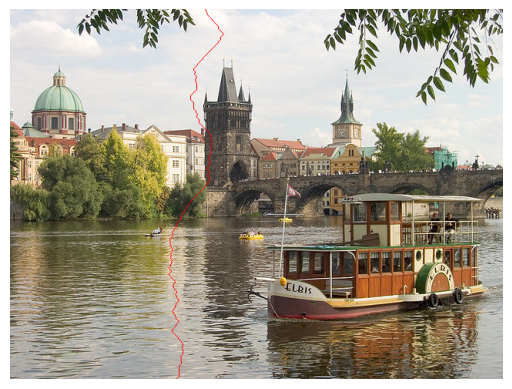

Horizontal seam on image:


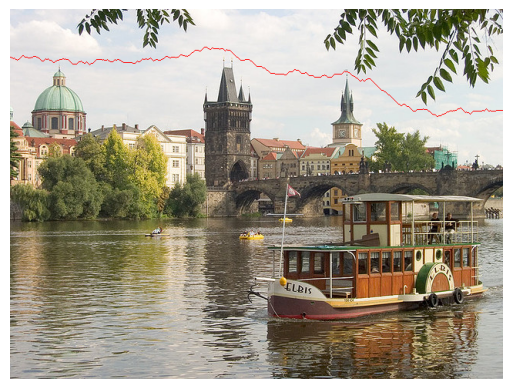

In [ ]:
img = prague.copy()
energy = energy_img(img).astype(np.float64)

cum_v = cumulative_min_energy_map(energy.copy(), 'VERTICAL')
v_seam = find_vertical_seam(cum_v)

cum_h = cumulative_min_energy_map(energy.copy(), 'HORIZONTAL')
h_seam = find_horizontal_seam(cum_h)

# visualize using view_seam
print("Vertical seam on image:")
view_seam(img, v_seam, 'VERTICAL')

print("Horizontal seam on image:")
view_seam(img, h_seam, 'HORIZONTAL')


#### Why are these seams optimal?

These 2 seams are optimal because they are the paths with the lowest cumulative energy vertically (top to bottom) or horizontally (left to right) within the image. They run through regions with the lowest amount of contrast. In the image, these low-contrast areas tend to be directly through a certain object and only intersecting another object when necessary (when the preceding object is run through already).

Specifically, we can see the vertical seam runs through the clouds in the sky which is almost one perfect color with no contrast. It avoids the blue in the sky because this would a higher cumulative energy seam. Likewise, with the vertical seam, we see that this line stays running through the sky until the sky intersects the bridge and has no other possible path to get to the bottom other than through another object. However, the seam continues within the low contrast region (within the object) until meeting another edge/object because these interesections have a higher cumulative energy.

## Question 5

#### - Modified energy function & comparison of differently computed seams

Original vertical seam:


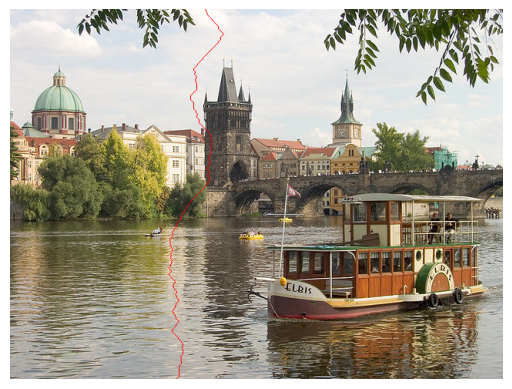

Gaussian vertical seam:


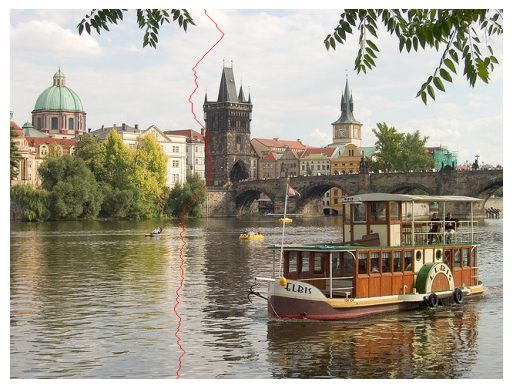

Original horizontal seam:


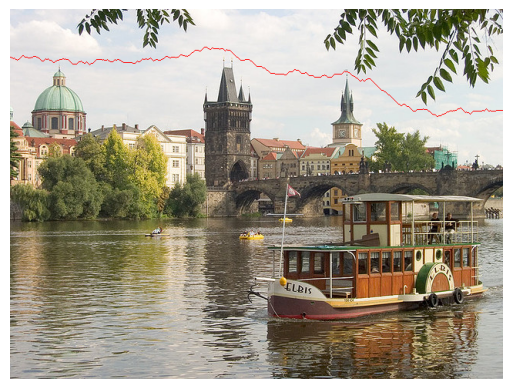

Gaussian horizontal seam:


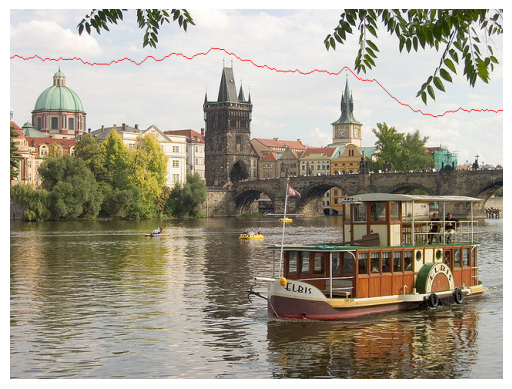

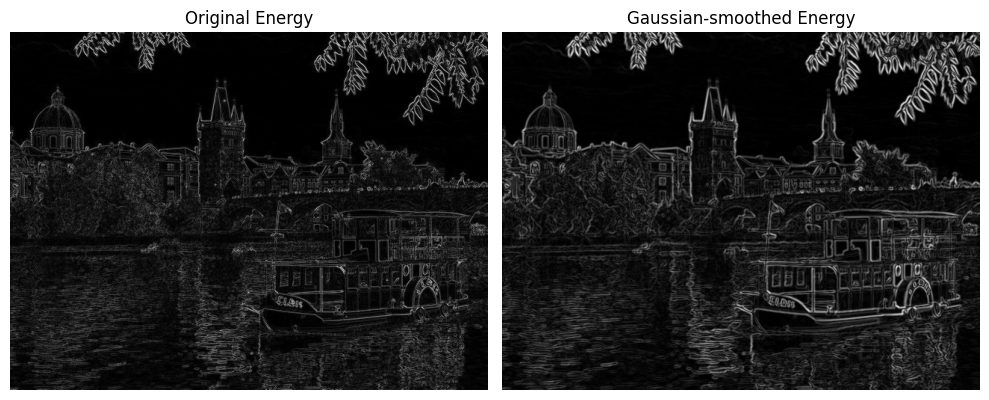

In [ ]:
# generate 2D kernel
def gaussian_kernel(size=100, sigma=1.0):

    # ensure size is odd so the kernel is symmetric
    assert size % 2 == 1

    # create coordinate grid centered at 0
    ax = np.arange(-(size//2), size//2 + 1)
    xx, yy = np.meshgrid(ax, ax)

    # Gaussian formula: exp(-(x^2 + y^2) / (2σ^2))
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))

    # normalize so sum of all weights = 1
    kernel = kernel / np.sum(kernel)

    return kernel

# use sliding window to do 2D convolution on greyscale image
def conv2d_manual(img, kernel, pad_mode='reflect'):

    H, W = img.shape               # Image height and width
    kh, kw = kernel.shape          # Kernel height and width
    ph, pw = kh//2, kw//2          # Padding needed on each side

    # pad image to handle borders
    if pad_mode == 'reflect':
        img_p = np.pad(img, ((ph,ph),(pw,pw)), mode='reflect')
    else:
        img_p = np.pad(img, ((ph,ph),(pw,pw)), mode='constant', constant_values=0)

    # allocate output array
    out = np.zeros_like(img, dtype=np.float64)

    # flip kernel for convolution
    k = np.flip(np.flip(kernel, axis=0), axis=1)

    # slide kernel over image
    for i in range(H):
        for j in range(W):
            window = img_p[i:i+kh, j:j+kw]   # local region
            out[i, j] = np.sum(window * k)   # sum of elementwise multiplication

    return out

# compute energy
def energy_img_gauss_manual(im, size=5, sigma=1.0):

    # greyscale conversion
    gray = 0.299*im[:,:,0] + 0.587*im[:,:,1] + 0.114*im[:,:,2]

    # build Gaussian kernel
    kernel = gaussian_kernel(size=size, sigma=sigma)

    # apply Gaussian smoothing (manual convolution)
    smoothed = conv2d_manual(gray, kernel)

    # compute gradients (x and y directions)
    dx = np.gradient(smoothed, axis=1)
    dy = np.gradient(smoothed, axis=0)

    # energy = |dx| + |dy|
    energy = np.abs(dx) + np.abs(dy)

    return energy

img = prague.copy()

# original energy and seams
orig_energy = energy_img(img).astype(np.float64)
cum_v = cumulative_min_energy_map(orig_energy.copy(), 'VERTICAL')
seam_v = find_vertical_seam(cum_v)
cum_h = cumulative_min_energy_map(orig_energy.copy(), 'HORIZONTAL')
seam_h = find_horizontal_seam(cum_h)

# gaussian-smoothed energy and seams
gauss_energy = energy_img_gauss_manual(img, size=5, sigma=1.0)
cum_vg = cumulative_min_energy_map(gauss_energy.copy(), 'VERTICAL')
seam_vg = find_vertical_seam(cum_vg)
cum_hg = cumulative_min_energy_map(gauss_energy.copy(), 'HORIZONTAL')
seam_hg = find_horizontal_seam(cum_hg)

print("Original vertical seam:")
view_seam(img, seam_v, 'VERTICAL')
print("Gaussian vertical seam:")
view_seam(img, seam_vg, 'VERTICAL')
print("Original horizontal seam:")
view_seam(img, seam_h, 'HORIZONTAL')
print("Gaussian horizontal seam:")
view_seam(img, seam_hg, 'HORIZONTAL')

# compare energy maps
show_images(
    ["Original Energy", "Gaussian-smoothed Energy"],
    [orig_energy, gauss_energy],
    figsize=(10,4)
)





## Explanation of new code

I implemented a Gaussian filter by creating a 2D kernel and applying it to the image using a sliding-window convolution. This blurs the image before computing gradient energies.

Compared to the original, the Gaussian-smoothed energy map suppresses smaller details, like the subtle texture/reflection in the water, and emphasizes larger structures, like the boat and building outlinings.

The seams created by the Gaussian smoothing function match up/align very similarly to the seams from the orignial energy function. If the image had more subtle or smaller edges spread across the image, then I assume that the Gaussian smoothing would have created straighter seams in comparison to the original energy function as it would have smoothened out these smaller edges/instances of noise.

## Question 6

#### - Custom pictures resizing and comparison between original, cv2 and my custom resizing functions


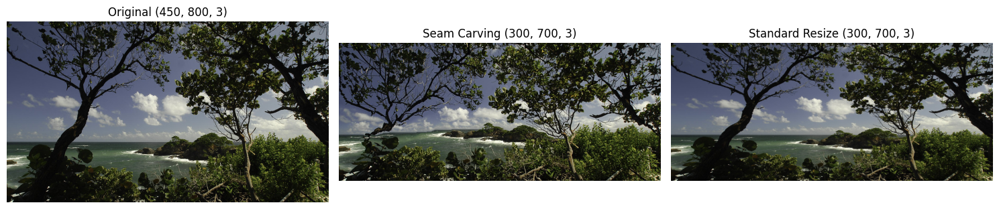

In [21]:
import cv2

# image resizing using cv2.resize
def resize_standard(im, new_shape):
    return cv2.resize(im, new_shape, interpolation=cv2.INTER_LINEAR)

# use both vertical and horizontal seams to reduce image size using my custom functions
def seam_carve_resize(im, k_vertical, k_horizontal):

    carved = remove_k_vertical(im, k_vertical)   # reduce width first
    carved = remove_k_horizontal(carved, k_horizontal)  # reduce height next
    return carved

### --- test image 1 beach --- ###

img1 = plt.imread("test1img_beach.jpg")  # load image
k_v, k_h = 100, 150  # seams to remove

# seam carving result
img_seam = seam_carve_resize(img1, k_v, k_h)

# standard resizing using cv2.resize
new_shape = (img1.shape[1] - k_v, img1.shape[0] - k_h)  # (width, height)
img_std = resize_standard(img1, new_shape)

# print results neatly
plt.figure(figsize=(15,5))

plt.subplot(1,3,1) # original image
plt.imshow(img1)
plt.title(f"Original {img1.shape}")
plt.axis("off")

plt.subplot(1,3,2) # seam carving resized image
plt.imshow(img_seam)
plt.title(f"Seam Carving {img_seam.shape}")
plt.axis("off")

plt.subplot(1,3,3) #
plt.imshow(img_std)
plt.title(f"Standard Resize {img_std.shape}")
plt.axis("off")

plt.tight_layout()
plt.show()



Example 1 image shows that the standard resizing of the image is performed better than using the seam reduction method. We can see distortion around the tree to the left of the middle image. The most likely reason for this distortion is that the algorithm computed some of the optimal vertical seams within the this tree object as there were minimum edges or noise within the shape. In doing this, this tree was not captured optimally with seam reduction resizing.

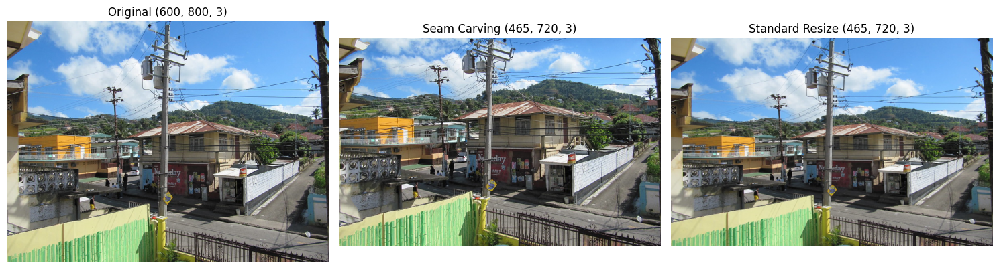

In [32]:
### --- test image 2 city --- ###

img2 = plt.imread("test2img_city.jpg")  # load image
k_v, k_h = 80, 135  # seams to remove

# seam carving result
img_seam = seam_carve_resize(img2, k_v, k_h)

# standard resizing using cv2.resize
new_shape = (img2.shape[1] - k_v, img2.shape[0] - k_h)  # (width, height)
img_std = resize_standard(img2, new_shape)

# print results neatly
plt.figure(figsize=(15,5))

plt.subplot(1,3,1) # original image
plt.imshow(img2)
plt.title(f"Original {img2.shape}")
plt.axis("off")

plt.subplot(1,3,2) # seam carving resized image
plt.imshow(img_seam)
plt.title(f"Seam Carving {img_seam.shape}")
plt.axis("off")

plt.subplot(1,3,3) #
plt.imshow(img_std)
plt.title(f"Standard Resize {img_std.shape}")
plt.axis("off")

plt.tight_layout()
plt.show()

Example 2 shows great use of the seam carving to reduce the size of the image. There are no clear distortions or sizing mistakes that make any of the significant objects in the image look poor. The seam carving predictably removed vertical seams to the left of the image that displayed only piece of a building and the horizontal seams removed included piece of the mountain and the sky to the top of the image. This resizing is much better than the previous example as it keeps all of the significant objects and edges of the original in tact.

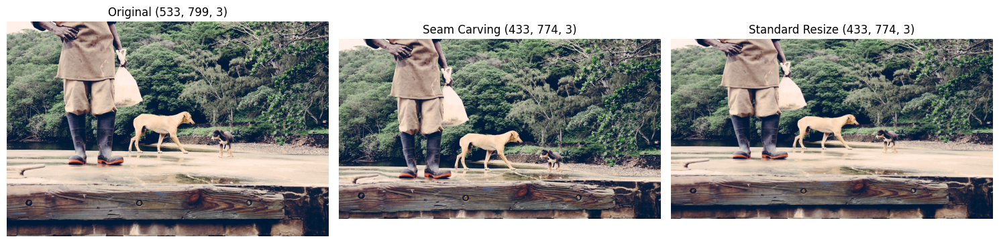

In [34]:
### --- test image 3 dog and forest --- ###

img3 = plt.imread("test3img_dog+forest.jpg")  # load image
k_v, k_h = 25, 100  # seams to remove

# seam carving result
img_seam = seam_carve_resize(img3, k_v, k_h)

# standard resizing using cv2.resize
new_shape = (img3.shape[1] - k_v, img3.shape[0] - k_h)  # (width, height)
img_std = resize_standard(img3, new_shape)

# print results neatly
plt.figure(figsize=(15,5))

plt.subplot(1,3,1) # original image
plt.imshow(img3)
plt.title(f"Original {img3.shape}")
plt.axis("off")

plt.subplot(1,3,2) # seam carving resized image
plt.imshow(img_seam)
plt.title(f"Seam Carving {img_seam.shape}")
plt.axis("off")

plt.subplot(1,3,3) #
plt.imshow(img_std)
plt.title(f"Standard Resize {img_std.shape}")
plt.axis("off")

plt.tight_layout()
plt.show()

Example 3 shows a decent image reduction using seam carving which was somewhat unexpected. The horizontal seams that were removed, such as the wood plank at the bottom and the trees to the top, did not affect the visual appeal of the resized image but instead only the vertical seams have made the image appear a bit distorted. This is because the clothes the man has on are uniform in color so the lowest cumulative energy areas were most likely around this region of the image and were therefore removed. The man's body appears much skinnier than the original. Also, the light brown dog also looks smaller and thinner which is most likely due to horizontal seams that intersected its body being removed.

## References

For openCV resizing, I used code and content from here to understand how to implement it in this project: https://www.geeksforgeeks.org/python/python-grayscaling-of-images-using-opencv/

I also used ChatGPT to finetune my helper functions to load, save and display the images. These functions included load_rgb , save_rgb and show_images.